## Project summary

### Highlights
1. Gather comprensive sources of data including state-levelcases, state-level census population, latitute, longitude, daily weather and state-level policy
2. RNN (LSTM/GRU) for cases into the future prediction for 51 states (exclude Puerto Rico Commonwealth) with pytorch implementation
3. Interactive visualization for historical vs predictions map (scroll to the bottom!)

### Data source
1. [2019 Novel Coronavirus COVID-19 /2019-nCoV Data Repository](https://github.com/CSSEGISandData/COVID-19) by Johns Hopkins CSSE
2. state-level census populartion, here on [census bureau](https://www2.census.gov/programs-surveys/popest/datasets/)
3. I dont want to calculate the latitude and longitude for each state, so I grabbed it from [kaggle](https://www.kaggle.com/washimahmed/usa-latlong-for-state-abbreviations#statelatlong.csv)
4. weather data from [world weather online](https://www.worldweatheronline.com/developer/api/historical-weather-api.aspx)
5. state-wide covid-19 policies gathered on github [here](https://github.com/COVID19StatePolicy/SocialDistancing)

### Clarifictions 
1. There are many state-wide policies. To simplify the analysis, we are only looking at the state-wide 'Stay at home' or 'Shelter at home' measures, as defined by Mandatory (instead of advisory) and covering many enough citiesm in case there are multiple (additional orders)

In [2]:
#general
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import os
#import datetime
from sklearn.preprocessing import MinMaxScaler
import pickle
import time
import datetime

#not so general modules
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

#import qwikidata
#import qwikidata.sparql
import urllib.request
from bs4 import BeautifulSoup

In [3]:
seed_val =1234
np.random.seed(seed_val)
torch.manual_seed(seed_val)

### Part 1. Data scraping and/or gathering

**1.1 state-level cases**

In [22]:
# Most important :cases data 
cases = pd.read_csv('../COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv')
display(cases.head()) 
cases.columns[:30] #check some earliest dates 

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,16,AS,ASM,16,60.0,NaN,American Samoa,US,-14.2710,-170.1320,...,0,0,0,0,0,0,0,0,0,0
1,316,GU,GUM,316,66.0,NaN,Guam,US,13.4443,144.7937,...,133,133,135,135,136,136,136,136,136,136
2,580,MP,MNP,580,69.0,NaN,Northern Mariana Islands,US,15.0979,145.6739,...,11,11,13,13,13,14,14,14,14,14
3,630,PR,PRI,630,72.0,NaN,Puerto Rico,US,18.2208,-66.5901,...,903,923,974,1043,1068,1118,1213,1252,1298,1252
4,850,VI,VIR,850,78.0,NaN,Virgin Islands,US,18.3358,-64.8963,...,51,51,51,51,51,53,53,53,53,54


Index(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_', 'Combined_Key', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20', '1/28/20', '1/29/20',
       '1/30/20', '1/31/20', '2/1/20', '2/2/20', '2/3/20', '2/4/20', '2/5/20',
       '2/6/20', '2/7/20', '2/8/20', '2/9/20'],
      dtype='object')

**1.2 state-level latitudes and longitudes**

In [56]:
#we will have latitude and longitude foe each state, without averagin/calculating 
statelatlong = pd.read_csv('statelatlong.csv')
display(statelatlong.head())

,State,Latitude,Longitude,City
0,AL,32.601011,-86.680736,Alabama
1,AK,61.302501,-158.775020,Alaska
2,AZ,34.168219,-111.930907,Arizona
3,AR,34.751928,-92.131378,Arkansas
4,CA,37.271875,-119.270415,California


**1.3 state-level populations**

In [10]:
#actually scratch that, we can get the file directly from here
#!wget https://www2.census.gov/programs-surveys/popest/datasets/2010-2019/state/detail/SCPRC-EST2019-18+POP-RES.csv 
pop2 = pd.read_csv('SCPRC-EST2019-18+POP-RES.csv', skiprows=[1])
display(pop2.head())
print(pop2.shape)

,SUMLEV,REGION,DIVISION,STATE,NAME,POPESTIMATE2019,POPEST18PLUS2019,PCNT_POPEST18PLUS
0,40,3,6,1,Alabama,4903185,3814879,77.8
1,40,4,9,2,Alaska,731545,551562,75.4
2,40,4,8,4,Arizona,7278717,5638481,77.5
3,40,3,7,5,Arkansas,3017804,2317649,76.8
4,40,4,9,6,California,39512223,30617582,77.5


(52, 8)


In [11]:
#get a list of states for extracing weather later
states_ls = pop2['NAME'].tolist()
states_ls = [ele.lower().replace(" ", "_") for ele in states_ls] #make names valid later

**1.4 state-level daily weather**

In [12]:
# crawling weather data for 24 states
from wwo_hist import retrieve_hist_data
frequency = 24
start_date = '22-JAN-2020'
end_date = '22-APR-2020'
api_key = '4b393631a6704b87bdd230235202404'
location_list = states_ls
hist_weather_data = retrieve_hist_data(api_key,
                                states_ls,
                                start_date,
                                end_date,
                                frequency,
                                location_label = False,
                                export_csv = True,
                                store_df = True)



Retrieving weather data for alabama


Currently retrieving data for alabama: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.658920
Currently retrieving data for alabama: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.827274
Currently retrieving data for alabama: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:02.920343
Currently retrieving data for alabama: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:06.040429


export alabama completed!




Retrieving weather data for alaska


Currently retrieving data for alaska: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.575892
Currently retrieving data for alaska: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.689981
Currently retrieving data for alaska: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:02.750660
Currently retrieving data for alaska: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:03.669056


expor

Time elapsed (hh:mm:ss.ms) 0:00:03.598110


export iowa completed!




Retrieving weather data for kansas


Currently retrieving data for kansas: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.447934
Currently retrieving data for kansas: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.576286
Currently retrieving data for kansas: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:03.041421
Currently retrieving data for kansas: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:04.054221


export kansas completed!




Retrieving weather data for kentucky


Currently retrieving data for kentucky: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.596272
Currently retrieving data for kentucky: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.690492
Currently retrieving data for kentucky: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:02.850470
Currently retrieving data for kentucky: from 2

Time elapsed (hh:mm:ss.ms) 0:00:02.642720
Currently retrieving data for new_mexico: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:03.657682


export new_mexico completed!




Retrieving weather data for new_york


Currently retrieving data for new_york: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.492035
Currently retrieving data for new_york: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.486201
Currently retrieving data for new_york: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:02.593426
Currently retrieving data for new_york: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:03.510247


export new_york completed!




Retrieving weather data for north_carolina


Currently retrieving data for north_carolina: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.948611
Currently retrieving data for north_carolina: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:02.184297
Currentl

Time elapsed (hh:mm:ss.ms) 0:00:00.518711
Currently retrieving data for washington: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.449240
Currently retrieving data for washington: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:02.639862
Currently retrieving data for washington: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:03.451013


export washington completed!




Retrieving weather data for west_virginia


Currently retrieving data for west_virginia: from 2020-01-22 to 2020-01-31
Time elapsed (hh:mm:ss.ms) 0:00:00.663115
Currently retrieving data for west_virginia: from 2020-02-01 to 2020-02-29
Time elapsed (hh:mm:ss.ms) 0:00:01.617048
Currently retrieving data for west_virginia: from 2020-03-01 to 2020-03-31
Time elapsed (hh:mm:ss.ms) 0:00:03.379190
Currently retrieving data for west_virginia: from 2020-04-01 to 2020-04-22
Time elapsed (hh:mm:ss.ms) 0:00:04.622200


export west_virginia completed!




Retrieving weather data for wis

**1.5 state-level policy**

In [4]:
#some Statewide excution order 
state_policy = pd.read_csv('../SocialDistancing/data/USstatesCov19distancingpolicy.csv',  encoding= 'unicode_escape')
display(state_policy.head())# we're interested in state-wide StayAtHome & Mandate==1 (order not just advisory) and DateEnacted

,location_id,StateFIPS,StatePostal,StateName,StatePolicy,Mandate,DateIssued,DateEnacted,DateExpiry,DateEnded,PolicyCodingNotes,PolicySource,StateWide,LastUpdated,LastUpdatedNotes
0,523,1,AL,Alabama,EmergDec,1.0,20200313.0,20200313.0,NaN,NaN,Public Health Emergency,https://governor.alabama.gov/newsroom/2020/03/...,1,20200324,NaN
1,523,1,AL,Alabama,SchoolClose,1.0,20200314.0,20200318.0,NaN,NaN,in effect 20200318. 20200319 issuance also clo...,http://alabamapublichealth.gov/legal/assets/42...,1,20200324,NaN
2,523,1,AL,Alabama,GathRestrict25,1.0,20200319.0,20200319.0,NaN,NaN,"In effect as of 5 pm 20200319. On 20200320, am...",https://governor.alabama.gov/assets/2020/03/Al...,1,20200420,Updated DateEnacted to 20200319 per state heal...
3,523,1,AL,Alabama,GathRestrictAny,1.0,20200319.0,20200319.0,NaN,NaN,"In effect as of 5 pm 20200319. On 20200320, am...",https://governor.alabama.gov/assets/2020/03/Al...,1,20200420,Updated DateEnacted to 20200319 per state heal...
4,523,1,AL,Alabama,OtherBusinessClose,1.0,20200319.0,20200319.0,NaN,NaN,All beaches close effective at 5 pm 20200319,https://governor.alabama.gov/assets/2020/03/Al...,1,20200420,Updated DateEnacted to 20200319 per state heal...


In [5]:
#let's filter the poly data, with only stayathoem or shelter at home and with dateEnacted
stayathome = state_policy.loc[(state_policy['StatePolicy'] == 'StayAtHome') & (state_policy['Mandate'] == 1.0)].copy()
print(stayathome.shape) 
#some states have multiple values, let's take the last one, usually it's the most comprehensive(covering most cities)
stayathome.drop_duplicates(subset = ['StatePostal'], keep = 'last', inplace =True)
display(stayathome.head())
#stayathome.to_csv('stayathome.csv', index = False)

(56, 15)


,location_id,StateFIPS,StatePostal,StateName,StatePolicy,Mandate,DateIssued,DateEnacted,DateExpiry,DateEnded,PolicyCodingNotes,PolicySource,StateWide,LastUpdated,LastUpdatedNotes
9,523,1,AL,Alabama,StayAtHome,1.0,20200403.0,20200404.0,20200430.0,NaN,Goes into effect at 5 pm on 20200403,http://www.alabamapublichealth.gov/legal/asset...,1,20200403,NaN
20,524,2,AK,Alaska,StayAtHome,1.0,20200327.0,20200328.0,20200411.0,NaN,In effect as of 5 pm on 20200328. To be reeval...,https://content.govdelivery.com/accounts/AKDHS...,1,20200330,NaN
27,525,4,AZ,Arizona,StayAtHome,1.0,20200330.0,20200331.0,20200430.0,NaN,NaN,https://azgovernor.gov/executive-orders/eo_202...,1,20200331,NaN
43,527,6,CA,California,StayAtHome,1.0,20200319.0,20200319.0,NaN,NaN,Issued/enacted immediatedly. Note shelter-in-p...,https://covid19.ca.gov/img/Executive-Order-N-3...,1,20200324,NaN
53,528,8,CO,Colorado,StayAtHome,1.0,20200325.0,20200326.0,20200411.0,NaN,Becomes active at 6:00 am on 20200326. (quote)...,https://drive.google.com/file/d/1O1EDCY6-A6QBK...,1,20200329,Added date of expiry


In [17]:
#what we really need for later visualizattion
stayathome_thin = stayathome[['StateName','DateEnacted']].reset_index()
stayathome_thin.drop('index', axis= 1, inplace = True)
temp = stayathome_thin['DateEnacted'].astype(str)
stayathome_thin['date'] = temp.str[:4] + '-' + temp.str[4:6]+ '-' + temp.str[6:8]
stayathome_thin = stayathome_thin[['StateName','date']]
display(stayathome_thin.head())
#stayathome_thin.to_csv('stayathome_thin.csv', index = False)

,StateName,date
0,Alabama,2020-04-04
1,Alaska,2020-03-28
2,Arizona,2020-03-31
3,California,2020-03-19
4,Colorado,2020-03-26


### Part2. Data processing for feeding RNN

####  2.1 data joining all together

In [52]:
cases_final = pd.DataFrame(columns = ['Province_State'])
# suumming up all cases in each state for each day 
for col in cases.columns[11:]:
    cases_agg = cases.groupby("Province_State").agg(**{col: pd.NamedAgg(column= col, aggfunc="sum")}).reset_index()
    cases_final = cases_final.merge(cases_agg, on = 'Province_State', how = 'outer')

print(cases_final.shape)
display(cases_final.head()) 
#cases_final.to_csv('cases_final.csv', index = False)

(58, 93)


,Province_State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,Alabama,0,0,0,0,0,0,0,0,0,...,3734,3953,4075,4345,4571,4712,4888,5079,5317,5593
1,Alaska,0,0,0,0,0,0,0,0,0,...,277,285,293,300,309,314,319,321,329,335
2,American Samoa,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Arizona,0,0,0,0,1,1,1,1,1,...,3705,3809,3964,4237,4511,4724,4933,5068,5256,5473
4,Arkansas,0,0,0,0,0,0,0,0,0,...,1410,1498,1569,1620,1695,1744,1781,1973,1990,2276


In [61]:
#join up latitude and long
cases_final2 = statelatlong.merge(cases_final, left_on ='NAME', right_on = 'Province_State', how= 'left')
cases_final2.drop(['City'], axis=1, inplace = True)
display(cases_final2.head()) 
print(cases_final2.shape)
#cases_final2.to_csv('cases_final2.csv', index = False)

,State,Latitude,Longitude,Province_State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,AL,32.601011,-86.680736,Alabama,0,0,0,0,0,0,...,3734,3953,4075,4345,4571,4712,4888,5079,5317,5593
1,AK,61.302501,-158.775020,Alaska,0,0,0,0,0,0,...,277,285,293,300,309,314,319,321,329,335
2,AZ,34.168219,-111.930907,Arizona,0,0,0,0,1,1,...,3705,3809,3964,4237,4511,4724,4933,5068,5256,5473
3,AR,34.751928,-92.131378,Arkansas,0,0,0,0,0,0,...,1410,1498,1569,1620,1695,1744,1781,1973,1990,2276
4,CA,37.271875,-119.270415,California,0,0,0,0,2,2,...,23931,25356,26686,27677,29157,30491,31431,33686,35465,37344


(51, 96)


In [64]:
#join up population 
cases_final3 = pop2[['NAME','POPESTIMATE2019']].merge(cases_final2, left_on ='NAME', right_on = 'Province_State', how= 'left')
cases_final3.drop(['Province_State'], axis=1, inplace = True)
display(cases_final3.head()) 
print(cases_final3.shape)
#cases_final3.to_csv('cases_final3.csv', index = False) #this is just great!

,NAME,POPESTIMATE2019,State,Latitude,Longitude,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20
0,Alabama,4903185,AL,32.601011,-86.680736,0.0,0.0,0.0,0.0,0.0,...,3734.0,3953.0,4075.0,4345.0,4571.0,4712.0,4888.0,5079.0,5317.0,5593.0
1,Alaska,731545,AK,61.302501,-158.775020,0.0,0.0,0.0,0.0,0.0,...,277.0,285.0,293.0,300.0,309.0,314.0,319.0,321.0,329.0,335.0
2,Arizona,7278717,AZ,34.168219,-111.930907,0.0,0.0,0.0,0.0,1.0,...,3705.0,3809.0,3964.0,4237.0,4511.0,4724.0,4933.0,5068.0,5256.0,5473.0
3,Arkansas,3017804,AR,34.751928,-92.131378,0.0,0.0,0.0,0.0,0.0,...,1410.0,1498.0,1569.0,1620.0,1695.0,1744.0,1781.0,1973.0,1990.0,2276.0
4,California,39512223,CA,37.271875,-119.270415,0.0,0.0,0.0,0.0,2.0,...,23931.0,25356.0,26686.0,27677.0,29157.0,30491.0,31431.0,33686.0,35465.0,37344.0


(52, 97)


#### 2.2  reshaping to what RNN needs,   states * (batches  * num_seq  * features)

In [6]:
#delete this later
cases_final3 = pd.read_csv('cases_final3.csv')
stayathome_thin = pd.read_csv('stayathome_thin.csv')

In [10]:
#a little function to shift data (-1) and (-7) to final array, ands stack them together. predict 1 day into the future
def combine_shift(data_case, lookback_col = ['case'], lookback= 7, pred_col = -1):
    #this part, previous -1 value for all 
    dt = data_case.copy()
    dt.drop(['date_time','pred'],axis =1, inplace = True)
    #dt = df.iloc[:-lookback, :] # for tempc, humidy, case, ppop,lat, long and stayathome
    dt['id'] = range(0, len(dt))
    dt.set_index('id', drop = True, inplace = True)
    print(dt.head())  #orignal date
    print(dt.shape)
    
    #this part, particularly case, -7for new feature 
    new_dt = data_case.copy()
    new_dt = new_dt[lookback_col].shift(lookback, fill_value =0) #seven days shifted (bottoms are nans)
    new_dt = new_dt.dropna()
    new_dt['id'] = range(0, len(new_dt))
    new_dt.set_index('id', drop = True, inplace = True) # cases info-7 days
    print(new_dt.head())
    print(new_dt.shape)
    
    #pred-value, discard the last 7 days, cuz we already used them in the -7 days info
    pred_value = data_case.copy()
    pred_value = pred_value.iloc[:, pred_col]
    pred_value.columns =['pred']
    pred_value = pd.DataFrame(pred_value)
    pred_value['id'] = range(0, len(pred_value))
    pred_value.set_index('id', drop = True, inplace =True)
    print(pred_value.head())
    print(pred_value.shape)
    
    final_df = pd.concat([dt, new_dt, pred_value],axis=1)
    part1 = [col +'_pre1' for col in list(dt.columns)]
    part2 = [col+'_pre'+ str(lookback) for col in list(new_dt.columns)]
    final_df.columns = part1+ part2 + ['pred']
    
    return final_df#, pred_value #X an Y, #of records (time steps) * 9 variables, 1 response 

In [19]:
# RNN-ize data and join with weather info: we have fixed components lat, long, poppulation;
# and changing components: cases (-1 day), cases (-7 day) + weather 
#exclude puerto rico
final_np = []
final_np_y = []
keep_weather = ['date_time','tempC', 'humidity']
stayathome_st = stayathome_thin.StateName.tolist()
#processing the weather + cases to what we wanted
for index, row in cases_final3.iterrows():
    if row[0] != 'Puerto Rico Commonwealth':
        case = row[5:]
        state = row[0].lower().replace(" ", "_")
        #weather info 
        df = pd.read_csv(state + '.csv')
        df = df[keep_weather]
        df['case'] = pd.Series(list(case), name= 'case')
        #static info
        df['pop'] = row.POPESTIMATE2019
        df['lat'] = row.Latitude
        df['long'] = row.Longitude
        #add stay at home turning point
        df['stayatHome'] = len(case) * [0]
        if row.NAME in stayathome_st: 
            measure_date = stayathome_thin[stayathome_thin.StateName==row.NAME].loc[:,'date'].values[0]
            print(measure_date)
            df.loc[df.date_time==measure_date,'stayatHome'] =1
        df['pred'] = df.case.shift(-1) #what we need to predict
        df = df.dropna()
        #print(df.head())
        #print(df.stayatHome.sum())
        df.to_csv(state + '_proc.csv', index = False)
        #some transformation for RNN inputs, for
        new_df = combine_shift(data_case =df, lookback_col = ['case'], lookback= 7, pred_col = -1)
        print(new_df.head(2))
        new_df_val = new_df.iloc[:,:].values
        #print(new_df_val)
        print(new_df_val.shape)
        final_np.append(new_df_val)

print(len(final_np)) #51 in total excluding puerto rico
assert final_np[0].shape == new_df_val.shape #for each state, we have 84 records (time steps) and 9 variables, and 1 predictor 

2020-04-04
    tempC  humidity  case      pop        lat       long  stayatHome
id                                                                  
0       9        56   0.0  4903185  32.601011 -86.680736           0
1      16        86   0.0  4903185  32.601011 -86.680736           0
2      16        74   0.0  4903185  32.601011 -86.680736           0
3      14        69   0.0  4903185  32.601011 -86.680736           0
4      11        84   0.0  4903185  32.601011 -86.680736           0
(91, 7)
    case
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    pred
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    tempC_pre1  humidity_pre1  case_pre1  pop_pre1   lat_pre1  long_pre1  \
id                                                                         
0            9             56        0.0   4903185  32.601011 -86.680736   
1           16             86        0.0   4903185  32.601011 -86.680736   

    stayatHome_pre1  case_pre7  pred  
id          

2020-03-25
    tempC  humidity  case      pop    lat     long  stayatHome
id                                                            
0      18        74   0.0  1415872  20.46 -157.505           0
1      22        52   0.0  1415872  20.46 -157.505           0
2      21        54   0.0  1415872  20.46 -157.505           0
3      22        56   0.0  1415872  20.46 -157.505           0
4      20        73   0.0  1415872  20.46 -157.505           0
(91, 7)
    case
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    pred
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    tempC_pre1  humidity_pre1  case_pre1  pop_pre1  lat_pre1  long_pre1  \
id                                                                        
0           18             74        0.0   1415872     20.46   -157.505   
1           22             52        0.0   1415872     20.46   -157.505   

    stayatHome_pre1  case_pre7  pred  
id                                    
0                 0

2020-03-24
    tempC  humidity  case      pop       lat       long  stayatHome
id                                                                 
0       1        69   0.0  9986857  44.94356 -86.415805           0
1       1        84   0.0  9986857  44.94356 -86.415805           0
2       2        96   0.0  9986857  44.94356 -86.415805           0
3       2        96   0.0  9986857  44.94356 -86.415805           0
4       1        93   0.0  9986857  44.94356 -86.415805           0
(91, 7)
    case
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    pred
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    tempC_pre1  humidity_pre1  case_pre1  pop_pre1  lat_pre1  long_pre1  \
id                                                                        
0            1             69        0.0   9986857  44.94356 -86.415805   
1            1             84        0.0   9986857  44.94356 -86.415805   

    stayatHome_pre1  case_pre7  pred  
id                     

    tempC_pre1  humidity_pre1  case_pre1  pop_pre1   lat_pre1  long_pre1  \
id                                                                         
0            5             53        0.0  10488084  35.214563 -79.891267   
1            7             71        0.0  10488084  35.214563 -79.891267   

    stayatHome_pre1  case_pre7  pred  
id                                    
0                 0        0.0   0.0  
1                 0        0.0   0.0  
(91, 9)
    tempC  humidity  case     pop        lat        long  stayatHome
id                                                                  
0      -1        88   0.0  762062  47.467882 -100.302266           0
1       1        98   0.0  762062  47.467882 -100.302266           0
2       1        99   0.0  762062  47.467882 -100.302266           0
3       1        97   0.0  762062  47.467882 -100.302266           0
4      -1        95   0.0  762062  47.467882 -100.302266           0
(91, 7)
    case
id      
0    0.0
1    0.0
2   

    tempC  humidity  case     pop        lat       long  stayatHome
id                                                                 
0      26        82   0.0  623989  43.871755 -72.447783           0
1      27        79   0.0  623989  43.871755 -72.447783           0
2      27        78   0.0  623989  43.871755 -72.447783           0
3      27        75   0.0  623989  43.871755 -72.447783           0
4      27        75   0.0  623989  43.871755 -72.447783           0
(91, 7)
    case
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    pred
id      
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
(91, 1)
    tempC_pre1  humidity_pre1  case_pre1  pop_pre1   lat_pre1  long_pre1  \
id                                                                         
0           26             82        0.0    623989  43.871755 -72.447783   
1           27             79        0.0    623989  43.871755 -72.447783   

    stayatHome_pre1  case_pre7  pred  
id                            

In [20]:
with open('shifted_numpy_ls.pkl', 'wb') as f:
     pickle.dump(final_np, f)
#with open('shifted_numpy_ls_y.pkl', 'wb') as f:
     #pickle.dump(final_np_y, f)
                
with open('shifted_numpy_ls.pkl', 'rb') as f:
    final_np_all = pickle.load(f)

#### 2.3 scale the data

In [21]:
# data normalization 
# need to have a scaler for each state, total we have 51 
xy = []
scalers = {}
order_state = {}
for i in range(len(final_np_all)):
    scalers[i] = MinMaxScaler(feature_range = (0,1))
    xy.append(scalers[i].fit_transform(final_np_all[i]))
    #this is the id corresponding to statenames
    order_state[i] = cases_final3.NAME.tolist()[i]

#scaled inputs 
with open('scaled_xy.pkl', 'wb') as f:
    pickle.dump(xy, f)
#scalers dict 
with open('scalers.dict', 'wb') as f:
    pickle.dump(scalers, f)
with open('order_state.dict', 'wb') as f:
    pickle.dump(order_state, f)

#### 2.4 split the data 

In [153]:
with open('scaled_xy.pkl', 'rb') as f:
    xy = pickle.load(f) 
with open('scalers.dict', 'rb') as f:
    scalers = pickle.load(f) 
with open('order_state.dict', 'rb') as f:
    order_state = pickle.load(f) 

In [5]:
# train, test split should be for each state, 
# meaning, split part of the future for each state as the testing 
train_seq, val_seq, testing_seq = 70, 7, 14 #
train_xy = [state[:train_seq] for state in xy]
valid_xy = [state[train_seq:train_seq + val_seq] for state in xy]
test_xy = [state[train_seq+val_seq:] for state in xy]
#split x and y
train_x, train_y = [state[:,:-1] for state in train_xy], [state[:,-1] for state in train_xy]
print(train_x[0].shape, train_y[0].shape)
valid_x, valid_y = [state[:,:-1] for state in valid_xy], [state[:,-1] for state in valid_xy]
print(valid_x[0].shape, valid_y[0].shape)
test_x, test_y = [state[:,:-1] for state in test_xy], [state[:,-1] for state in test_xy]
print(test_x[0].shape, test_y[0].shape) #all list of numpys

(70, 8) (70,)
(7, 8) (7,)
(14, 8) (14,)


#### 2.5  Tensorize & prepare dataloader

In [80]:
# all tensorize, double
train_x_tensor = torch.stack([torch.from_numpy(state) for state in train_x],dim=0)
train_y_tensor  = torch.stack([torch.from_numpy(state) for state in train_y],dim= 0)
valid_x_tensor = torch.stack([torch.from_numpy(state) for state in valid_x],dim =0)
valid_y_tensor  = torch.stack([torch.from_numpy(state) for state in valid_y],dim =0)
test_x_tensor = torch.stack([torch.from_numpy(state) for state in test_x],dim =0)
test_y_tensor  = torch.stack([torch.from_numpy(state) for state in test_y],dim =0)

In [81]:
print(train_x_tensor.size(), train_y_tensor.size())

torch.Size([51, 70, 8]) torch.Size([51, 70])


In [82]:
#data loader
train_data = TensorDataset(train_x_tensor, train_y_tensor)
valid_data = TensorDataset(valid_x_tensor, valid_y_tensor)
test_data = TensorDataset(test_x_tensor, test_y_tensor)  

In [83]:
batch_size = 17 
train_sampler = RandomSampler(train_data) 
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size= batch_size, drop_last= True)
valid_sampler = SequentialSampler(valid_data)
valid_dataloader = DataLoader(valid_data, sampler=valid_sampler, batch_size=batch_size, drop_last= True)
test_sampler = SequentialSampler(test_data)
test_dataloader = DataLoader(test_data, sampler=test_sampler, batch_size=batch_size, drop_last = True)

In [84]:
#delete later
for x,y in train_dataloader:
    print(x.type())
    break

torch.DoubleTensor


### Part3. Model building

In [102]:
class casePredictor(nn.Module):
    
    def __init__(self, n_features = 8, n_hidden = 64, n_layers=2, dropout =0.2, rnn = 'gru'):
        super(casePredictor, self).__init__()
        self.n_hidden = n_hidden
        #self.seq_len = seq_len
        self.n_layers = n_layers
        self.dropout = dropout
        if rnn == 'lstm':
            self.rnn = nn.LSTM(input_size=n_features, hidden_size= self.n_hidden, num_layers=self.n_layers, 
                               batch_first = True, dropout = self.dropout)
        else:
            self.rnn = nn.GRU(input_size=n_features, hidden_size=self.n_hidden, num_layers=self.n_layers, 
                              batch_first = True, dropout = self.dropout)
        self.relu  = F.relu
        self.linear = nn.Linear(in_features= self.n_hidden, out_features=1)

            
    def forward(self, state_inputs, state_labels, criterion):
       
        #for each in states_inputs:
        batch_size = state_inputs.size(0) #let's choose 17
        hidden = self.init_hidden(batch_size)
        if self.rnn == 'lstm':
            rnn_out, (hidden, c) = self.rnn(state_inputs, hidden )      
        else:
            rnn_out,  hidden = self.rnn(state_inputs, hidden)
            
        seq_out = rnn_out.view(batch_size, -1, self.n_hidden)
        flat_out = self.relu(seq_out) #17* 70* 64 
        y_pred = self.linear(flat_out) # 17*70*1 for traing, 17*7*1 for valid, and 17*14*1 for testing
        y_pred = torch.squeeze(y_pred, dim = 2).double()

        loss =  criterion(y_pred.view(-1), state_labels.view(-1))
         
        return y_pred, state_labels, loss
    
    
    def init_hidden(self, batch_size):
        #double() type important for precision
        #different cells: lstm vs. GRU needs differnt initalization
        if self.rnn == 'lstm':
            h0 = torch.zeros(self.n_layers, batch_size, self.n_hidden).double()
            c0 = torch.zeros(self.n_layers, batch_size, self.n_hidden).double()
            hidden = (h0, c0)
        else:
            h0 = torch.zeros(self.n_layers, batch_size, self.n_hidden).double()
            hidden = h0
        return hidden

In [103]:
# getting device ready
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') #cpu only 

#### 3.2 initiate model with hyper paramterss

In [104]:
model = casePredictor()
model.double() #model type important, need to be double for precision
model.to(device)

casePredictor(
  (rnn): GRU(8, 64, num_layers=2, batch_first=True, dropout=0.2)
  (linear): Linear(in_features=64, out_features=1, bias=True)
)

In [105]:
n_epochs = 100
lr=0.01
wt_decay = 1e-4

In [106]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=wt_decay)

#### 3.3. epochs training,  validation and test

In [107]:
def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    elapsed_rounded = int(round((elapsed)))
    return str(datetime.timedelta(seconds=elapsed_rounded))

In [108]:
training_stats = []
total_t0 = time.time()

In [109]:
for epoch in range(1, n_epochs + 1):

    print("")
    print('======== Epoch {:} / {:} ========'.format(epoch, n_epochs))
    print('Training...')
    
    t0 = time.time()
    # Reset the total loss for this epoch
    total_train_loss = 0
    model.train()
    
    for step, batch in enumerate(train_dataloader):

        # update every 400 batches.
        if step % 10 == 0 and not step == 0:

            elapsed = format_time(time.time() - t0) 
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))

        
        b_inputs= batch[0].to(device)
        b_labels = batch[1].to(device)

        model.zero_grad()        
        
        y_pred, labels, loss = model(b_inputs, b_labels, criterion)
        
        total_train_loss += loss.item()
        loss.backward()      
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

    avg_train_loss = total_train_loss / len(train_dataloader)            
    
    training_time = format_time(time.time() - t0)
    print("")
    print("  Average training loss: {0:.2f}".format(avg_train_loss))
    print("  Training epcoh took: {:}".format(training_time))


    # validatsion 
    print("")
    print("Running Validation...")

    t0 = time.time()

    # Put the model in evaluation mode
    model.eval()

    # Tracking variables 
    total_eval_accuracy = 0
    total_eval_loss = 0
    nb_eval_steps = 0

    # Evaluate data for one epoch
    for batch in valid_dataloader:
        
        b_inputs= batch[0].to(device)
        b_labels = batch[1].to(device)
        

        with torch.no_grad():        
            y_pred, labels, loss = model(b_inputs, b_labels, criterion)

        total_eval_loss += loss.item()

    avg_val_loss = total_eval_loss / len(valid_dataloader)
    validation_time = format_time(time.time() - t0)
    
    print("  Validation Loss: {0:.2f}".format(avg_val_loss))
    print("  Validation took: {:}".format(validation_time))

    # Record all statistics from this epoch.
    training_stats.append(
        {
            'epoch': epoch ,
            'Training Loss': avg_train_loss,
            'Valid. Loss': avg_val_loss,
            'Training Time': training_time,
            'Validation Time': validation_time
        }
    )

print("")
print("Training complete!")
print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))


======== Epoch 1 / 100 ========
Training...

  Average training loss: 0.01
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.16
  Validation took: 0:00:00

======== Epoch 2 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.16
  Validation took: 0:00:00

======== Epoch 3 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.14
  Validation took: 0:00:00

======== Epoch 4 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.14
  Validation took: 0:00:00

======== Epoch 5 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.11
  Validation took: 0:00:00

======== Epoch 6 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh to


  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 47 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 48 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 49 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 50 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 51 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Val


  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 93 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 94 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 95 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 96 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Validation Loss: 0.01
  Validation took: 0:00:00

======== Epoch 97 / 100 ========
Training...

  Average training loss: 0.00
  Training epcoh took: 0:00:00

Running Validation...
  Val

In [111]:
# training stats
pd.set_option('precision', 5)
df_stats = pd.DataFrame(data=training_stats)

df_stats = df_stats.set_index('epoch')
# Display the table.
print(df_stats)
df_stats.to_csv('df_stats.csv')

       Training Loss  Valid. Loss Training Time Validation Time
epoch                                                          
1            0.01342      0.16031       0:00:00         0:00:00
2            0.00356      0.15580       0:00:00         0:00:00
3            0.00316      0.13643       0:00:00         0:00:00
4            0.00287      0.13780       0:00:00         0:00:00
5            0.00263      0.11235       0:00:00         0:00:00
...              ...          ...           ...             ...
96           0.00015      0.01066       0:00:00         0:00:00
97           0.00026      0.01260       0:00:00         0:00:00
98           0.00016      0.01155       0:00:00         0:00:00
99           0.00016      0.01128       0:00:00         0:00:00
100          0.00011      0.01221       0:00:00         0:00:00

[100 rows x 4 columns]


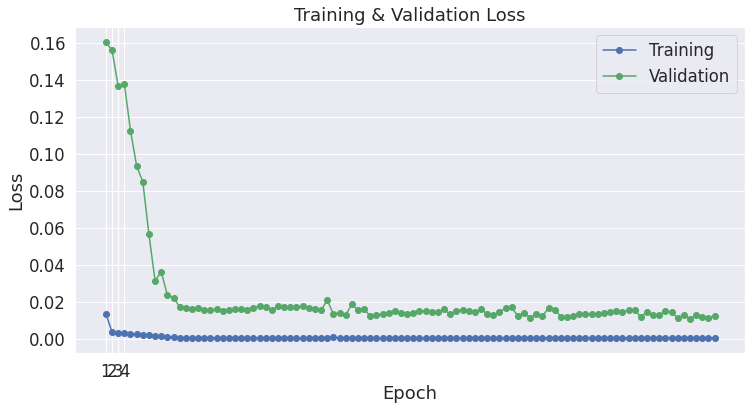

In [112]:
%matplotlib inline

sns.set(style='darkgrid')
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

plt.plot(df_stats['Training Loss'], 'b-o', label="Training")
plt.plot(df_stats['Valid. Loss'], 'g-o', label="Validation")

plt.title("Training & Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.xticks([1, 2, 3, 4])
plt.show()

In [120]:
output_dir = 'model_save/'

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

torch.save(model, output_dir +'model')
torch.save(model.state_dict(), output_dir +'model.st')

"""
#Later to restore:
#model.load_state_dict(torch.load(output_dir))
#model.eval()

#or
state = {
    'epoch': epoch,
    'state_dict': model.state_dict(),
    'optimizer': optimizer.state_dict()}

torch.save(state, output_dir)
"""

"\n#Later to restore:\n#model.load_state_dict(torch.load(output_dir))\n#model.eval()\n\n#or\nstate = {\n    'epoch': epoch,\n    'state_dict': model.state_dict(),\n    'optimizer': optimizer.state_dict()}\n\ntorch.save(state, output_dir)\n"

In [124]:
# Prediction on test set
print('Predicting for {:,} states for {:,} days'.format(len(test_dataloader) *  batch_size, testing_seq)) 

model.eval()
predictions , true_labels = [], []

for batch in test_dataloader:
        b_inputs= batch[0].to(device)
        b_labels = batch[1].to(device)

        with torch.no_grad():
            y_pred, labels, loss = model(b_inputs, b_labels, criterion)

        y_pred = y_pred.detach().cpu().numpy()
        labels = labels.to('cpu').numpy()

        predictions.append(y_pred)
        true_labels.append(labels)

print('    DONE.')

with open('predictions.pkl', 'wb') as f:
    pickle.dump(predictions, f)
with open('true_labels.pkl', 'wb') as f:
    pickle.dump(true_labels, f)

Predicting for 51 states for 14 days
    DONE.


### Part4. Visualization


#### 4.1 transform back to original scales  & process into the format we want

In [143]:
#reshape a little 
pred_np = np.concatenate(predictions, axis = 0)
print(pred_np.shape)
#np.save('pred_np',pred_np)

(51, 14)


In [147]:
# get the dates 
cases_final3 = pd.read_csv('cases_final3.csv')
dates_all = list(cases_final3.columns)[5+1:]#starting from the 1.23 (as prediction values instead) 91

91

In [181]:
# we have a scaler for each state
# for each state,stack prediction vs true in the original scale together 
# also for all states we get the history
predsVStrue_dict = {}
history_dict ={}
for i in range(len(scalers)):
    #for predictions 
    inv_xy = np.concatenate((xy[i][-pred_np.shape[1]:,:8], pred_np[i].reshape(-1,1)), axis =1)
    inv_pred = scalers[i].inverse_transform(inv_xy)
    inv_pred = inv_pred[:,-1]
    #print(inv_pred.shape)
    
    #for actual
    inv_true = scalers[i].inverse_transform(xy[i][-pred_np.shape[1]:,])
    inv_true = inv_true[:,-1]
    #print(inv_true.shape)
    
    pred_true = np.concatenate((inv_pred.reshape(-1,1), inv_true.reshape(-1,1)),axis =1)
    #print(pred_true.shape)
    pred_true = np.concatenate((np.asarray(dates_all[-pred_np.shape[1]:]).reshape(-1,1), pred_true), axis =1)
    pred_true_df = pd.DataFrame(pred_true, columns = ['date', 'pred', 'truth'])
    predsVStrue_dict[order_state[i]] = pred_true_df #date, pred, actual
    
    #for all history
    inv_all = scalers[i].inverse_transform(xy[i])
    inv_all = inv_all[:,-1]
    history = np.concatenate((np.asarray(dates_all).reshape(-1,1),  inv_all.reshape(-1,1)), axis =1)
    history_df = pd.DataFrame(history, columns = ['date', 'truth'])
    history_dict[order_state[i]] = history_df
    

with open('predsVStrue.dict', 'wb') as f:
    pickle.dump(predsVStrue_dict, f)    

In [198]:
#concatenate all historical cases
for k, df in history_dict.items():
    df['state'] = k
df_allhistory = pd.concat(list(history_dict.values()), axis = 0)
print(df_allhistory.shape)

(4641, 3)


In [226]:
#save all histrical cases to clean dataframe
df_map = cases_final3[['NAME','POPESTIMATE2019','State', 'Latitude', 'Longitude']].merge(df_allhistory, left_on = 'NAME', 
                                                                                     right_on = 'state')
#coercing types
df_map['truth'] = pd.to_numeric(df_map.truth)
df_map['date'] = pd.to_datetime(df_map.date)
print(df_map.shape) 
display(df_map.head())
#df_map.to_csv('df_map.csv', index = False)

(4641, 8)


,NAME,POPESTIMATE2019,State,Latitude,Longitude,date,truth,state
0,Alabama,4903185,AL,32.60101,-86.68074,2020-01-23,0.0,Alabama
1,Alabama,4903185,AL,32.60101,-86.68074,2020-01-24,0.0,Alabama
2,Alabama,4903185,AL,32.60101,-86.68074,2020-01-25,0.0,Alabama
3,Alabama,4903185,AL,32.60101,-86.68074,2020-01-26,0.0,Alabama
4,Alabama,4903185,AL,32.60101,-86.68074,2020-01-27,0.0,Alabama


In [239]:
#predictions 
for k, df in predsVStrue_dict.items():
    df['state'] = k
df_predvsTrue = pd.concat(list(predsVStrue_dict.values()), axis = 0)
print(df_predvsTrue.shape)

(714, 4)


In [252]:
#save all predictions to clean dataframe
df_map2 = cases_final3[['NAME','POPESTIMATE2019','State', 'Latitude', 'Longitude']].merge(df_predvsTrue, left_on = 'NAME', 
                                                                                     right_on = 'state')
#coercing types
df_map2['truth'] = pd.to_numeric(df_map2.truth)
df_map2['pred'] = pd.to_numeric(df_map2.pred).astype(int)
df_map2['date'] = pd.to_datetime(df_map2.date)
print(df_map2.shape) 
display(df_map2.head())

df_map2.to_csv('df_map2.csv', index = False)

(714, 9)


,NAME,POPESTIMATE2019,State,Latitude,Longitude,date,pred,truth,state
0,Alabama,4903185,AL,32.60101,-86.68074,2020-04-09,764,2703.0,Alabama
1,Alabama,4903185,AL,32.60101,-86.68074,2020-04-10,1727,2947.0,Alabama
2,Alabama,4903185,AL,32.60101,-86.68074,2020-04-11,2450,3217.0,Alabama
3,Alabama,4903185,AL,32.60101,-86.68074,2020-04-12,2962,3563.0,Alabama
4,Alabama,4903185,AL,32.60101,-86.68074,2020-04-13,3345,3734.0,Alabama


#### 4.2 simple plots for historical & testing 14 days into the (then) future

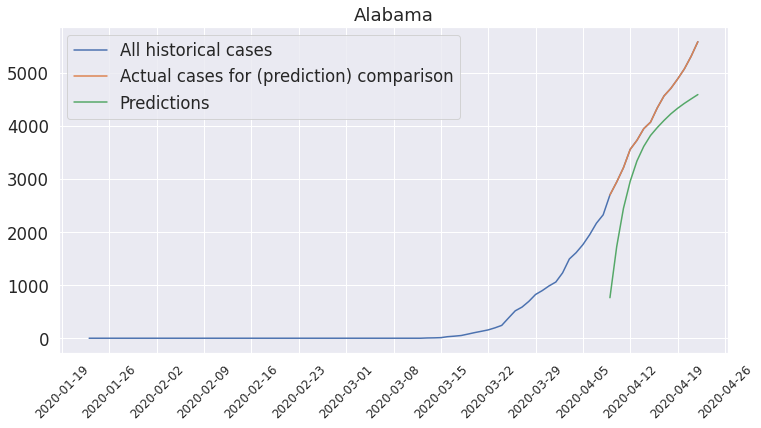

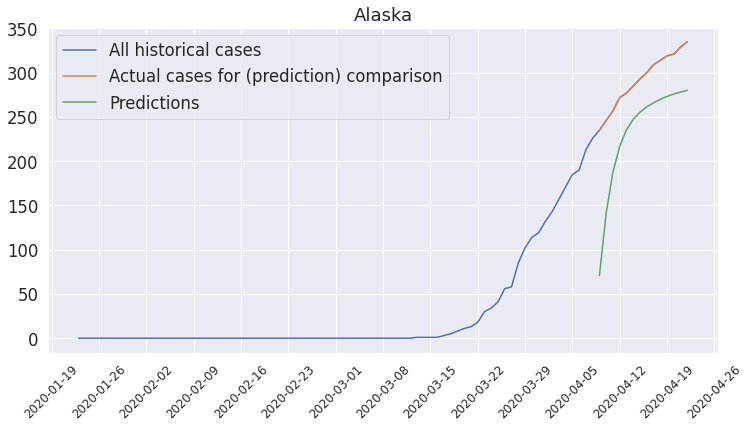

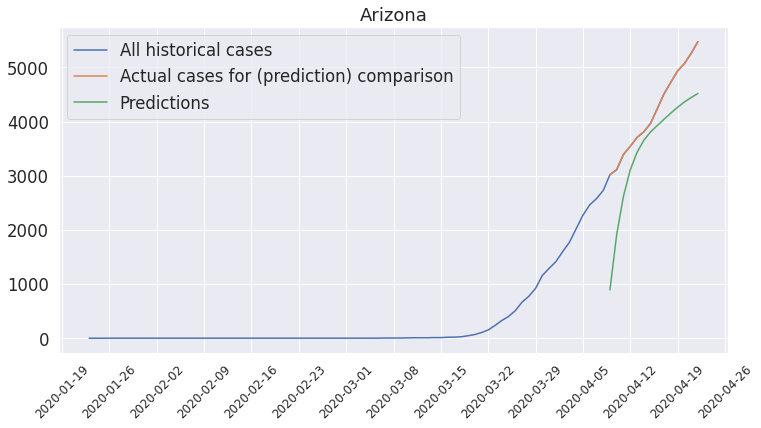

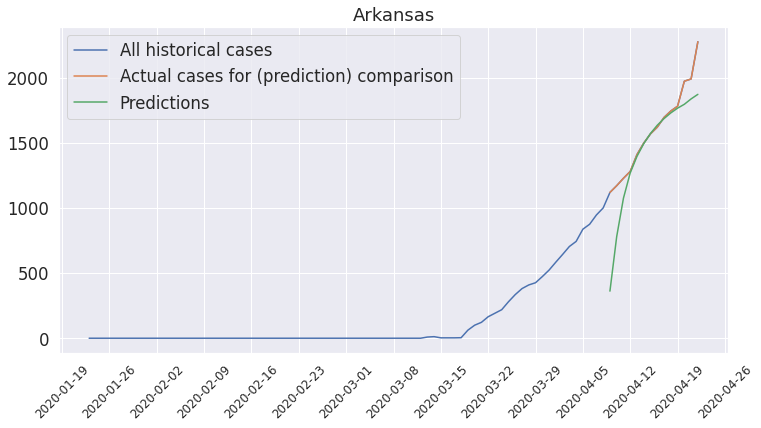

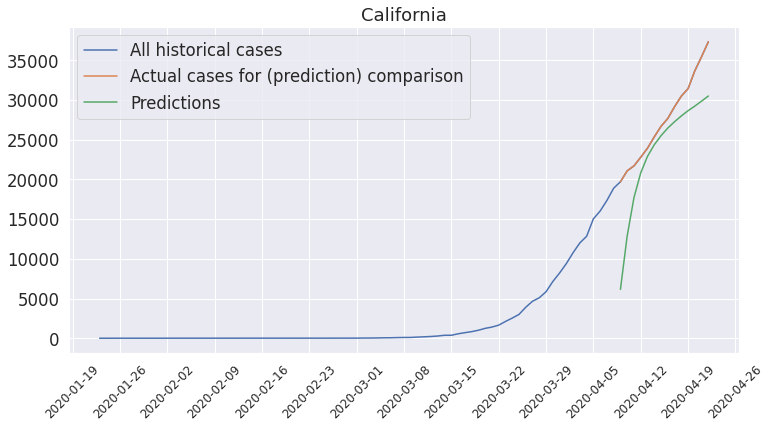

...

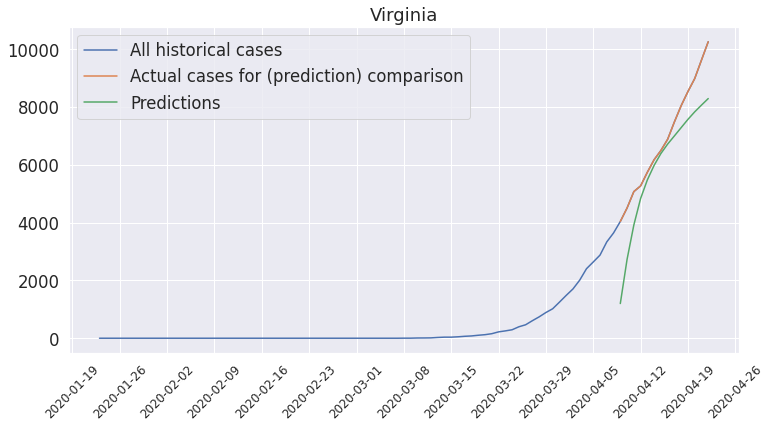

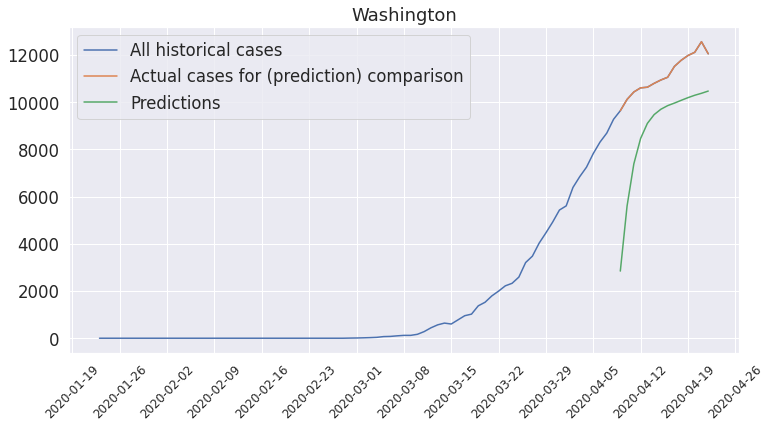

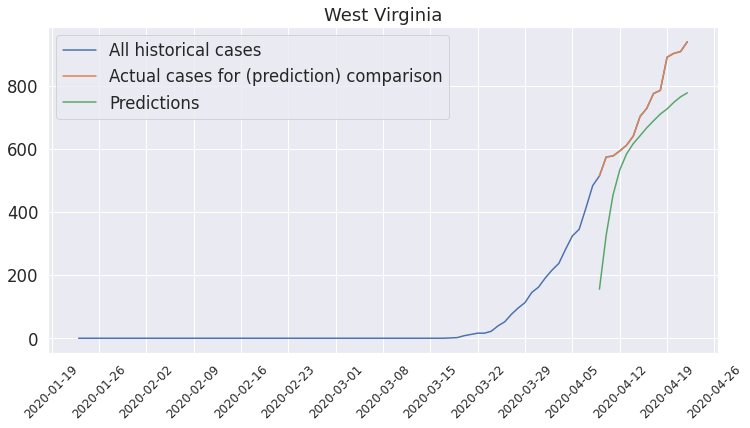

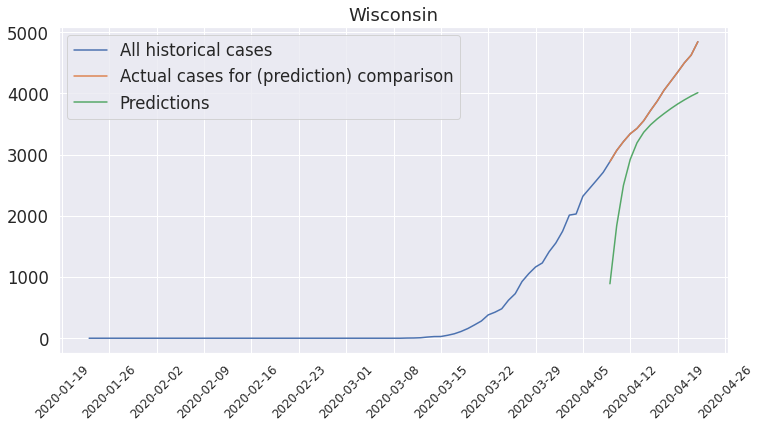

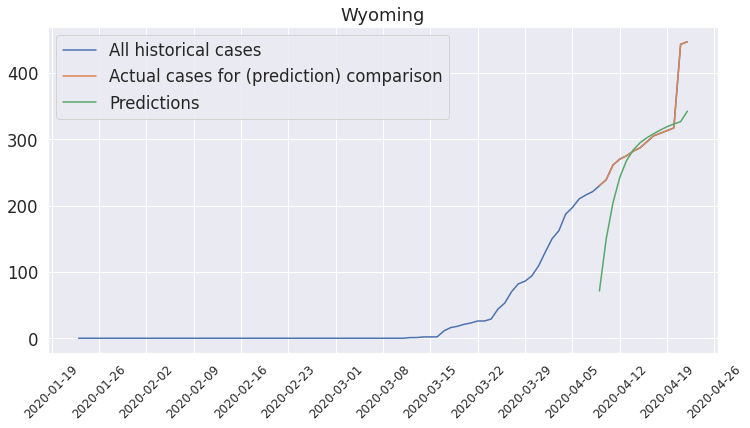

In [261]:
#just checking hwo close/far off they are 
for name, val in predsVStrue_dict.items():
    plt.plot(pd.to_datetime(pd.Series(history_dict[name].date)),  pd.to_numeric(pd.Series(history_dict[name].truth)), label ='All historical cases' )
    plt.plot(pd.to_datetime(pd.Series(val.date)), pd.to_numeric(pd.Series(val.truth)), label= 'Actual cases for (prediction) comparison')
    plt.plot(pd.to_datetime(pd.Series(val.date)), pd.to_numeric(pd.Series(val.pred)),  label = 'Predictions')
    plt.xticks(rotation=45, size = 12)
    plt.legend()
    plt.gca().xaxis.set_major_locator(ticker.MultipleLocator(7))
    plt.title(name)
    plt.show();

#### 4.3 fancy plot with interactive map

**4.3.1 actual cases**

In [4]:
#historical cases
import plotly.express as px
df = pd.read_csv('df_map.csv')
fig = px.scatter(df, x='Longitude', y='Latitude', animation_frame="date", animation_group="NAME",
           size="truth", color="NAME", hover_name="NAME",
           log_x=False, size_max= 200)
fig.show()
#fig.write_html("actual_historical_cases.html")

#### 4.3.2 Predictions 

In [11]:
#predictions
#final prediction visualization
import plotly.express as px
import plotly.graph_objects as go 
df_map2 = pd.read_csv('df_map2.csv')
#df_map2.date = df_map2.date.dt.strftime('%Y-%m-%d')
fig_map = px.scatter_mapbox(df_map2, lat='Latitude', lon='Longitude',  color='NAME', 
                size=df_map2['pred'], color_discrete_sequence= px.colors.sequential.Plasma_r, 
                size_max=100, animation_frame='date',
                center=dict({'lat': 38.50, 'lon': -98.68}), zoom=3, hover_data= ['NAME']) #center:US
#here on wards various layouts have been called in to bring it in the present shape
fig_map.update_layout(mapbox_style= "carto-positron",width= 900, height=700)
fig_map.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#update frame speed
fig_map.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 200
#update different layouts
fig_map.layout.sliders[0].currentvalue.xanchor="left"
fig_map.layout.sliders[0].currentvalue.offset=-100
fig_map.layout.sliders[0].currentvalue.prefix=""
fig_map.layout.sliders[0].len=.9
fig_map.layout.sliders[0].currentvalue.font.color="indianred"
fig_map.layout.sliders[0].currentvalue.font.size=20
fig_map.layout.sliders[0].y= 1.1
fig_map.layout.sliders[0].x= 0.15
fig_map.layout.updatemenus[0].y=1.27
fig_map.show()